<a href="https://colab.research.google.com/github/iamviji/project/blob/master/End2End8PSK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!rm -rf project
!git clone https://github.com/iamviji/project.git
!ls
!ls project
!pip install pyldpc
!pip install scikit-commpy



Cloning into 'project'...
remote: Enumerating objects: 1491, done.
remote: Counting objects: 100% (72/72), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 1491 (delta 36), reused 0 (delta 0), pack-reused 1419
Receiving objects: 100% (1491/1491), 166.92 MiB | 10.78 MiB/s, done.
Resolving deltas: 100% (845/845), done.
Updating files: 100% (190/190), done.
analysis
archive
EncoderModulatorSplitArch.ipynb
EncoderOutputExperiment.ipynb
EncoderWithoutNormalizationLayer.ipynb
End2End8PSK.ipynb
End2EndOneHotQPSK.ipynb
End2EndQPSK.ipynb
End2EndQPSKRegularized.ipynb
Experiment
Final
golden-copy
KerasOneHot_BPSK.ipynb
ldpc_ber_12_11.png
ldpc_ber_18_11.png
MainModel.ipynb
MainModelKeras.ipynb
MainModelKerasOneHot.ipynb
MainModelModCodingConstEnergy.ipynb
MainModelModCoding.ipynb
MainModelOneHotMethod.ipynb
MainModelOneHotMethodSoftMax.ipynb
MainModelOneHotModCoding.ipynb
MainModelWithSingleBERTraining.ipynb
misc
PosMidTerm
PostMidTerm
project
README.md
Report
Snap
TensorFlow_D

In [2]:
import pyldpc
import commpy
import numpy 
import time
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior ()

Instructions for updating:
non-resource variables are not supported in the long term


In [3]:
SNR_BEGIN = 0
SNR_END = 10
SNR_STEP_SIZE = 0.5
CHANEL_SIZE = 18
NUM_OF_INPUT_MESSAGE = 1000
LDPC_MAX_ITER = 100
num_parity_check = 3
num_bits_in_parity_check = 6 
input_message_length =  0 # Caculated by channel encoder and initialized later

In [4]:
def timer_update(i,current,time_tot,tic_incr=500):
    last = current
    current = time.time()
    t_diff = current-last
    print('SNR: {:04.3f} - Iter: {} - Last {} iterations took {:03.2f}s'.format(snr,i+1,tic_incr,t_diff))
    return time_tot + t_diff

def Snr2Sigma(snr):
  sigma = 10 ** (- snr / 20)
  return sigma

def pyldpc_encode (CodingMatrix, message):
  rng = pyldpc.utils.check_random_state(seed=None)
  d = pyldpc.utils.binaryproduct(CodingMatrix, message)
  encoded_message = (-1) ** d
  return encoded_message

def pyldpc_decode (ParityCheckMatrix, CodingMatrix, message, snr, maxiter):
  decoded_msg = pyldpc.decode(ParityCheckMatrix, message, snr, maxiter)
  out_message = pyldpc.get_message(CodingMatrix, decoded_msg)
  return out_message

awgn_channel_input = tf.compat.v1.placeholder(tf.float64, [CHANEL_SIZE])
awgn_noise_std_dev = tf.placeholder(tf.float64)
awgn_noise = tf.random.normal(tf.shape(awgn_channel_input), stddev=awgn_noise_std_dev, dtype=tf.dtypes.float64)
awgn_channel_output = tf.add(awgn_channel_input, awgn_noise)

init = tf.global_variables_initializer ()
sess = tf.Session ()
sess.run(init)

def AWGNChannelOutput (xx, snr , s):
  sigma = Snr2Sigma (snr)
  awgn_channel_output_message = s.run ([awgn_channel_output], feed_dict={noise_std_dev:sigma, channel_input:xx})
  return awgn_channel_output_message

In [5]:

ParityCheckMatrix, CodingMatrix = pyldpc.make_ldpc(CHANEL_SIZE, num_parity_check, num_bits_in_parity_check, systematic=True, sparse=True)
input_message_length = CodingMatrix.shape[1]
print ("input_message_size=", input_message_length, "channel_size=",CHANEL_SIZE)
print ("input_message_size=", CodingMatrix.shape[1], "channel_size=",CodingMatrix.shape[0])
input_message = numpy.random.randint(2, size=(NUM_OF_INPUT_MESSAGE,input_message_length))
print (input_message)

input_message_size= 11 channel_size= 18
input_message_size= 11 channel_size= 18
[[0 1 1 ... 0 0 1]
 [1 1 0 ... 0 0 1]
 [1 1 0 ... 1 0 0]
 ...
 [1 0 0 ... 0 0 1]
 [1 1 0 ... 0 0 0]
 [1 1 0 ... 0 0 0]]


This section tries to compare BER and Time performance of PYLDPC in following 3 cases
1. SNR Noise function provided in encoder function of pyldpc library (pyldpc.encode)
2. SNR Noise function provided by commpy library (commpy.channels.awgn) 
3. SNR Noise function implemented using tensorflow 

In [6]:
# Here I am using tensor flow based AWGN, to make sure that effect of it is same as AWGN
output_display_counter = NUM_OF_INPUT_MESSAGE/4
ber_per_iter_tensor  = numpy.array(())
times_per_iter_tensor = numpy.array(())
for snr in numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE):
  total_bit_error = 0
  total_msg_error = 0
  total_time = 0
  current_time = time.time()
  for i in range (NUM_OF_INPUT_MESSAGE):
    encoded_message = pyldpc_encode (CodingMatrix, input_message[i])
    sigma = Snr2Sigma (snr)
    awgn_channel_output_message = sess.run ([awgn_channel_output], feed_dict={awgn_noise_std_dev:sigma, awgn_channel_input:encoded_message})[0]
    decoded_message = pyldpc_decode(ParityCheckMatrix, CodingMatrix, awgn_channel_output_message, snr, LDPC_MAX_ITER)
    if abs(decoded_message-input_message[i]).sum() != 0 :
      #print ("count=",abs(decoded_message-input_message[i]).sum())
      total_msg_error = total_msg_error + 1
    if (i+1) % output_display_counter == 0:
      total_time = timer_update(i, current_time,total_time, output_display_counter)
  ber = float(total_msg_error)/NUM_OF_INPUT_MESSAGE
  print('SNR: {:04.3f}:\n -> BER: {:03.2f}\n -> Total Time: {:03.2f}s'.format(snr,ber,total_time))
  ber_per_iter_tensor=numpy.append(ber_per_iter_tensor ,ber)
  times_per_iter_tensor=numpy.append(times_per_iter_tensor, total_time)

/home/neelabhro/.local/lib/python3.8/site-packages/pyldpc/decoder.py:62: UserWarning: Decoding stopped before convergence. You may want
                       to increase maxiter
  warnings.warn("""Decoding stopped before convergence. You may want
SNR: 0.000 - Iter: 250 - Last 250.0 iterations took 1.47s
SNR: 0.000 - Iter: 500 - Last 250.0 iterations took 2.83s
SNR: 0.000 - Iter: 750 - Last 250.0 iterations took 4.16s
SNR: 0.000 - Iter: 1000 - Last 250.0 iterations took 5.46s
SNR: 0.000:
 -> BER: 0.61
 -> Total Time: 13.91s
SNR: 0.500 - Iter: 250 - Last 250.0 iterations took 0.95s
SNR: 0.500 - Iter: 500 - Last 250.0 iterations took 2.06s
SNR: 0.500 - Iter: 750 - Last 250.0 iterations took 3.10s
SNR: 0.500 - Iter: 1000 - Last 250.0 iterations took 4.17s
SNR: 0.500:
 -> BER: 0.52
 -> Total Time: 10.27s
SNR: 1.000 - Iter: 250 - Last 250.0 iterations took 0.83s
SNR: 1.000 - Iter: 500 - Last 250.0 iterations took 1.77s
SNR: 1.000 - Iter: 750 - Last 250.0 iterations took 2.59s
SNR: 1.000 - I

In [7]:
# Here I am using commpy based AWGN 
output_display_counter = NUM_OF_INPUT_MESSAGE/4
ber_per_iter_awgn  = numpy.array(())
times_per_iter_awgn = numpy.array(())
for snr in numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE):
  total_bit_error = 0
  total_msg_error = 0
  total_time = 0
  current_time = time.time()
  for i in range (NUM_OF_INPUT_MESSAGE):
    encoded_message = pyldpc_encode (CodingMatrix, input_message[i])
    awgn_channel_output_message = commpy.channels.awgn(encoded_message, snr)
    decoded_message = pyldpc_decode(ParityCheckMatrix, CodingMatrix, awgn_channel_output_message, snr, LDPC_MAX_ITER)
    if abs(decoded_message-input_message[i]).sum() != 0 :
      total_msg_error = total_msg_error + 1
    if (i+1) % output_display_counter == 0:
      total_time = timer_update(i, current_time,total_time, output_display_counter)
  ber = float(total_msg_error)/NUM_OF_INPUT_MESSAGE
  print('SNR: {:04.3f}:\n -> BER: {:03.2f}\n -> Total Time: {:03.2f}s'.format(snr,ber,total_time))
  ber_per_iter_awgn=numpy.append(ber_per_iter_awgn ,ber)
  times_per_iter_awgn=numpy.append(times_per_iter_awgn, total_time)

SNR: 0.000 - Iter: 250 - Last 250.0 iterations took 1.32s
SNR: 0.000 - Iter: 500 - Last 250.0 iterations took 2.52s
SNR: 0.000 - Iter: 750 - Last 250.0 iterations took 3.74s
SNR: 0.000 - Iter: 1000 - Last 250.0 iterations took 4.89s
SNR: 0.000:
 -> BER: 0.62
 -> Total Time: 12.48s
SNR: 0.500 - Iter: 250 - Last 250.0 iterations took 0.95s
SNR: 0.500 - Iter: 500 - Last 250.0 iterations took 1.98s
SNR: 0.500 - Iter: 750 - Last 250.0 iterations took 3.01s
SNR: 0.500 - Iter: 1000 - Last 250.0 iterations took 3.89s
SNR: 0.500:
 -> BER: 0.54
 -> Total Time: 9.84s
SNR: 1.000 - Iter: 250 - Last 250.0 iterations took 0.84s
SNR: 1.000 - Iter: 500 - Last 250.0 iterations took 1.65s
SNR: 1.000 - Iter: 750 - Last 250.0 iterations took 2.51s
SNR: 1.000 - Iter: 1000 - Last 250.0 iterations took 3.21s
SNR: 1.000:
 -> BER: 0.43
 -> Total Time: 8.20s
SNR: 1.500 - Iter: 250 - Last 250.0 iterations took 0.66s
SNR: 1.500 - Iter: 500 - Last 250.0 iterations took 1.34s
SNR: 1.500 - Iter: 750 - Last 250.0 iter

In [8]:
# Here I am using tensor flow based AWGN, to make sure that effect of it is same as AWGN
output_display_counter = NUM_OF_INPUT_MESSAGE/4
ber_per_iter_pyldpc  = numpy.array(())
times_per_iter_pyldpc = numpy.array(())
for snr in numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE):
  total_bit_error = 0
  total_msg_error = 0
  total_time = 0
  current_time = time.time()
  for i in range (NUM_OF_INPUT_MESSAGE):
    encoded_message = pyldpc.encode (CodingMatrix, input_message[i], snr)
    awgn_channel_output_message = encoded_message
    decoded_message = pyldpc_decode(ParityCheckMatrix, CodingMatrix, awgn_channel_output_message, snr, LDPC_MAX_ITER)
    if abs(decoded_message-input_message[i]).sum() != 0 :
      total_msg_error = total_msg_error + 1
    if (i+1) % output_display_counter == 0:
      total_time = timer_update(i, current_time,total_time, output_display_counter)
  ber = float(total_msg_error)/NUM_OF_INPUT_MESSAGE
  print('SNR: {:04.3f}:\n -> BER: {:03.2f}\n -> Total Time: {:03.2f}s'.format(snr,ber,total_time))
  ber_per_iter_pyldpc=numpy.append(ber_per_iter_pyldpc ,ber)
  times_per_iter_pyldpc=numpy.append(times_per_iter_pyldpc, total_time)

SNR: 0.000 - Iter: 250 - Last 250.0 iterations took 1.20s
SNR: 0.000 - Iter: 500 - Last 250.0 iterations took 2.37s
SNR: 0.000 - Iter: 750 - Last 250.0 iterations took 3.65s
SNR: 0.000 - Iter: 1000 - Last 250.0 iterations took 4.83s
SNR: 0.000:
 -> BER: 0.60
 -> Total Time: 12.05s
SNR: 0.500 - Iter: 250 - Last 250.0 iterations took 0.97s
SNR: 0.500 - Iter: 500 - Last 250.0 iterations took 1.97s
SNR: 0.500 - Iter: 750 - Last 250.0 iterations took 2.91s
SNR: 0.500 - Iter: 1000 - Last 250.0 iterations took 3.99s
SNR: 0.500:
 -> BER: 0.53
 -> Total Time: 9.84s
SNR: 1.000 - Iter: 250 - Last 250.0 iterations took 0.81s
SNR: 1.000 - Iter: 500 - Last 250.0 iterations took 1.59s
SNR: 1.000 - Iter: 750 - Last 250.0 iterations took 2.38s
SNR: 1.000 - Iter: 1000 - Last 250.0 iterations took 3.11s
SNR: 1.000:
 -> BER: 0.44
 -> Total Time: 7.90s
SNR: 1.500 - Iter: 250 - Last 250.0 iterations took 0.62s
SNR: 1.500 - Iter: 500 - Last 250.0 iterations took 1.30s
SNR: 1.500 - Iter: 750 - Last 250.0 iter

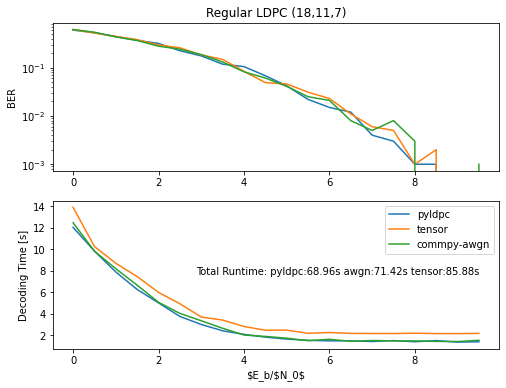

In [9]:
# Compare 3 AWGN(Tensorflow, CommPy, PYLDPC) Simulation on LDPC
import matplotlib.pyplot as plt
%matplotlib inline
snrs = numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE)
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(8,6))
ax1.semilogy(snrs,ber_per_iter_pyldpc,'', label="pyldpc") # plot BER vs SNR
ax1.semilogy(snrs,ber_per_iter_tensor,'', label="tensor") # plot BER vs SNR
ax1.semilogy(snrs,ber_per_iter_awgn,'', label="commpy-awgn") # plot BER vs SNR

ax1.set_ylabel('BER')
ax1.set_title('Regular LDPC ({},{},{})'.format(CHANEL_SIZE,input_message_length,CHANEL_SIZE-input_message_length))
ax2.plot(snrs,times_per_iter_pyldpc,'', label="pyldpc") # plot decode timing for different SNRs
ax2.plot(snrs,times_per_iter_tensor,'', label="tensor") # plot decode timing for different SNRs
ax2.plot(snrs,times_per_iter_awgn,'', label="commpy-awgn") # plot decode timing for different SNRs
ax2.set_xlabel('$E_b/$N_0$')
ax2.set_ylabel('Decoding Time [s]')
ax2.annotate('Total Runtime: pyldpc:{:03.2f}s awgn:{:03.2f}s tensor:{:03.2f}s'.format(numpy.sum(times_per_iter_pyldpc), 
            numpy.sum(times_per_iter_awgn), numpy.sum(times_per_iter_tensor)),
            xy=(1, 0.35), xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
plt.savefig('ldpc_ber_{}_{}.png'.format(CHANEL_SIZE,input_message_length))
plt.legend ()
plt.show()

<B>Conclussion:</B>
      It proved that tensorflow behaves similar to AWGN noise channel provided by pyldpc, commpy. But tensor flow based one takes adds little more time delay. This need to be offseted if we are comparing performance. 

In [10]:
#18/6 = 3 bit per symbol => 8-PSK
num_of_channel = 6 
input_message_length = 11
encoder_output_length = 18

In [11]:
# Define Model 

# input_message_length is initialized by ldpc encoder

print ("input_message_length=", input_message_length)
print ("num_of_channel=", num_of_channel)
print ("encoder_output_length=", encoder_output_length)

num_of_hidden_layer_node = encoder_output_length

input_message_x = tf.placeholder("float32", [None, input_message_length], name="input_message_x")
awgn_noise_std_dev_x = tf.placeholder("float32", name ="awgn_noise_std_dev")
input_channel_x = tf.placeholder("float32", [None, num_of_channel * 2], name="input_channel_x")

weights = {
  "encoder_l1" : tf.Variable (tf.random_uniform([input_message_length, num_of_hidden_layer_node], -1, 1), name="encoder_l1_weights"),
  "encoder_l2" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node, num_of_channel * 2], -1, 1), name="encoder_l2_weights"),
  "decoder_l1" : tf.Variable (tf.random_uniform([num_of_channel * 2, num_of_hidden_layer_node], -1, 1), name="decoder_l1_weights"),
  "decoder_l2" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node, num_of_hidden_layer_node], -1, 1), name="decoder_l2_weights"),
  "decoder_l3" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node, input_message_length], -1, 1), name="decoder_l3_weights"),
}

biases = {
  "encoder_l1" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node], -1,1), name="encoder_l1_bias"),
  "encoder_l2" : tf.Variable (tf.random_uniform([num_of_channel * 2], -1,1), name="encoder_l2_bias"),
  "decoder_l1" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node], -1,1), name="decoder_l1_bias"),
  "decoder_l2" : tf.Variable (tf.random_uniform([num_of_hidden_layer_node], -1,1), name="decoder_l2_bias"),
  "decoder_l3" : tf.Variable (tf.random_uniform([input_message_length], -1,1), name="decoder_l3_bias"),
}

def dl_encoder (x):
  layer_1 = tf.nn.tanh (tf.matmul(x, weights['encoder_l1']) + biases['encoder_l1'])
  layer_2 = (tf.matmul(layer_1, weights['encoder_l2']) + biases['encoder_l2'])
  #layer_2 = tf.round(layer_1)
  #layer_2 = layer_1
  layer_3 =  layer_2 / tf.sqrt(tf.reduce_mean(tf.square(layer_2)))
  #x = tf.sqrt(tf.reduce_sum(tf.square(layer_2), axis=1))
  #x = tf.reshape (x, (-1,1))
  #layer_2 = layer_1 / x
  #layer_2 =  tf.nn.relu(layer_1)
  return layer_3

#input_channel_x = tf.placeholder("float32", [None, 3], name="input_channel_x")
#x = tf.sqrt(tf.reduce_sum(tf.square(input_channel_x), axis=1))
#x = tf.reshape(x, (-1, 1))
#l = x
#l = input_channel_x / x
def dl_decoder (x):
  layer_1 = (tf.matmul(x, weights['decoder_l1']) + biases['decoder_l1'])
  layer_2 = tf.nn.tanh (tf.matmul(layer_1, weights['decoder_l2']) + biases['decoder_l2'])
  layer_3 = tf.nn.sigmoid(tf.matmul(layer_2, weights['decoder_l3']) + biases['decoder_l3'])
  #layer_3 = tf.nn.sigmoid (tf.matmul(layer_2, weights['decoder_l3']) + biases['decoder_l3'])
  return layer_3

def awgn_layer(x):
  awgn_noise = tf.random.normal(tf.shape(x), stddev=awgn_noise_std_dev_x,  name="awgn_noise")
  awgn_channel_output = tf.add(x, awgn_noise, name ="x_and_noise")
  return awgn_channel_output


dl_encoder_output = dl_encoder(input_message_x)
dl_decoder_input = awgn_layer(dl_encoder_output)
#awgn_noise = tf.random.normal(tf.shape(dl_encoder_output), stddev=awgn_noise_std_dev,  name="awgn_noise")
#dl_decoder_input = tf.add(dl_encoder_output, awgn_noise, name ="x_and_noise")
dl_decoder_output = dl_decoder (dl_decoder_input)
dl_decoder_only_output = dl_decoder(input_channel_x)


loss1 = tf.reduce_mean (-1 * (input_message_x*tf.log(dl_decoder_output) + (1 - input_message_x)*tf.log(1 - dl_decoder_output) ))
#loss1 = tf.losses.sigmoid_cross_entropy(multi_class_labels=input_message_x,logits=dl_decoder_output)
lr = tf.placeholder(dtype=tf.float32,shape=[])
rms_optimizer = tf.train.AdamOptimizer(learning_rate=0.00007).minimize (loss1)
rms_optimizer1 = tf.train.AdamOptimizer(learning_rate=0.0001).minimize (loss1)


awgn_channel_input = tf.compat.v1.placeholder(tf.float64, [num_of_channel * 2])
awgn_noise_std_dev = tf.placeholder(tf.float64)
awgn_noise = tf.random.normal(tf.shape(awgn_channel_input), stddev=awgn_noise_std_dev, dtype=tf.dtypes.float64)
awgn_channel_output = tf.add(awgn_channel_input, awgn_noise)

input_message_length= 11
num_of_channel= 6
encoder_output_length= 18


In [12]:
awgn_channel_input = tf.compat.v1.placeholder(tf.float64, [num_of_channel * 2])
awgn_noise_std_dev = tf.placeholder(tf.float64)
awgn_noise = tf.random.normal(tf.shape(awgn_channel_input), stddev=awgn_noise_std_dev, dtype=tf.dtypes.float64)
awgn_channel_output = tf.add(awgn_channel_input, awgn_noise)

In [13]:
training_input_message = numpy.random.randint(2, size=(NUM_OF_INPUT_MESSAGE*10,input_message_length))
print (training_input_message)
print (len(training_input_message))

[[0 0 1 ... 0 1 0]
 [0 1 0 ... 1 1 1]
 [0 0 0 ... 1 0 1]
 ...
 [0 1 0 ... 0 1 1]
 [1 1 1 ... 0 1 0]
 [1 0 1 ... 1 1 0]]
10000


In [14]:
class GetOutOfLoop( Exception ):
    pass

batch_size = 1000


# Training
train_init = tf.global_variables_initializer ()
train_sess = tf.Session ()

epochs = 125
outer_ephocs = 1
display_step = epochs/2
num_of_batches = len(training_input_message) / batch_size
print ("batch_size:", batch_size, "num_of_batcches:", num_of_batches)
train_sess.run(train_init)
l = 0
lrate = 1
try:
  for oe in range(outer_ephocs):
    for snr in (numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE)):
      sigma = 1.0*Snr2Sigma (snr)
      print ("Training for SNR=", snr, " sigma=", sigma) 
      if (snr < 6): opt = rms_optimizer1
      else : opt = rms_optimizer 
      for e in range(epochs):
        for j in range (int(num_of_batches)):
          x_train_batch = training_input_message [j*batch_size:(j+1)*batch_size]
          x_train_batch_float = x_train_batch.astype("float32")
          _, l = train_sess.run ([opt, loss1], feed_dict={input_message_x:x_train_batch_float, awgn_noise_std_dev_x:sigma, lr:lrate})
          if (l < 0.5): lrate = 0.001
          if (l < 0.25): lrate = 0.00001
          if (l < 0.1): lrate = 0.0000001
          if (l < 0.07): lrate = 0.0000001
          if j % display_step == 0:
            print('Step %i: Minibatch Loss: %f' % (i*display_step+j, l))
          #if (l < 0.005): raise GetOutOfLoop
except GetOutOfLoop:
  print("Early Stop")

072362
Step 62437: Minibatch Loss: 0.075266
Step 62437: Minibatch Loss: 0.074392
Step 62437: Minibatch Loss: 0.075870
Step 62437: Minibatch Loss: 0.074069
Step 62437: Minibatch Loss: 0.075663
Step 62437: Minibatch Loss: 0.071345
Step 62437: Minibatch Loss: 0.072378
Step 62437: Minibatch Loss: 0.073964
Step 62437: Minibatch Loss: 0.074102
Step 62437: Minibatch Loss: 0.073301
Step 62437: Minibatch Loss: 0.070095
Step 62437: Minibatch Loss: 0.074671
Step 62437: Minibatch Loss: 0.072791
Step 62437: Minibatch Loss: 0.074299
Step 62437: Minibatch Loss: 0.072537
Step 62437: Minibatch Loss: 0.074662
Step 62437: Minibatch Loss: 0.072304
Step 62437: Minibatch Loss: 0.073901
Step 62437: Minibatch Loss: 0.073408
Step 62437: Minibatch Loss: 0.073650
Step 62437: Minibatch Loss: 0.074016
Step 62437: Minibatch Loss: 0.074067
Step 62437: Minibatch Loss: 0.075077
Step 62437: Minibatch Loss: 0.072387
Step 62437: Minibatch Loss: 0.072773
Step 62437: Minibatch Loss: 0.072392
Step 62437: Minibatch Loss: 0.0

In [15]:
#a = [[1,2],[3,4]]
#x=a/numpy.sqrt(numpy.sum(numpy.square(a),axis=1).reshape([2,1]))
#print (x)
#print (1/numpy.sqrt(5))
#print (x[0][0]**2+x[0][1]**2)

#input_channel_x = tf.placeholder("float32", [None, 2], name="input_channel_x")
#x = tf.sqrt(tf.reduce_sum(tf.square(input_channel_x), axis=1))
#x = tf.reshape(x, (-1, 1))
#l = x
#l = input_channel_x / x

#ans=train_sess.run ([l], feed_dict={input_channel_x:a})
#print (ans)

#print (ans[0][0]**2+ans[0][1]**2)

In [16]:
def bits2int(a, axis=-1):
    return numpy.right_shift(numpy.packbits(a, axis=axis), 8 - a.shape[axis]).squeeze()


def row_bits2int(arr):
    n = arr.shape[1]  # number of columns
    # shift the bits of the first column to the left by n - 1
    a = arr[:, 0] << n - 1  

    for j in range(1, n):
        # "overlay" with the shifted bits of the next column
        a |= arr[:, j] << n - 1 - j  
    return a

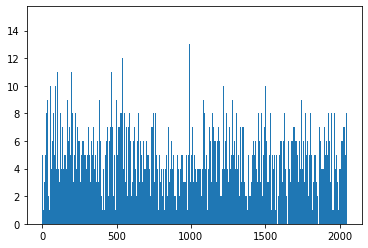

In [17]:
#input_message_length=8
#training_input_message = numpy.random.randint(2, size=(NUM_OF_INPUT_MESSAGE*10,input_message_length))
training_input_message_decimal = row_bits2int(training_input_message)
#uniqueValues, indicesList = numpy.unique(training_input_message_decimal, return_index=True)
x_axis = numpy.arange(0,2**input_message_length)
y_axis = row_bits2int(training_input_message)
#x=numpy.histogram(training_input_message_decimal,bins = x_axis) 
plt.hist(training_input_message_decimal, bins = x_axis) 
plt.show()

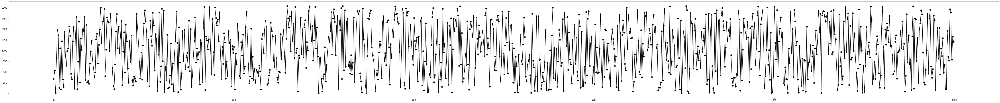

In [18]:
x_axis = numpy.arange(0,NUM_OF_INPUT_MESSAGE*10)
plt.figure(figsize=(80, 8))
plt.plot(x_axis[:NUM_OF_INPUT_MESSAGE],training_input_message_decimal[:NUM_OF_INPUT_MESSAGE], '-ok')
#print (x_axis[:100])
#print(training_input_message_decimal[:100])

In [19]:
# Here I am using trained model
NUM_OF_INPUT_MESSAGE_BER = NUM_OF_INPUT_MESSAGE * 10
output_display_counter = NUM_OF_INPUT_MESSAGE/4
ber_per_iter_dl_tensor  = numpy.array(())
times_per_iter_dl_tensor = numpy.array(())

channel_in = []
channel_out = []
data_category = []
print (len (channel_in))
for snr in numpy.arange (0, 10, SNR_STEP_SIZE):
  total_bit_error = 0
  total_msg_error = 0
  total_time = 0
  current_time = time.time()
  sigma = Snr2Sigma (snr)
  for i in range (NUM_OF_INPUT_MESSAGE):
    input_message_xx = training_input_message [i:i+1]
    data_category.append (training_input_message_decimal [i:i+1][0])
    input_message_xx_float = input_message_xx.astype("float32")
    encoded_message = train_sess.run ([dl_encoder_output], feed_dict={input_message_x:input_message_xx_float})
    #print (encoded_message[0][0])
    channel_in.append(encoded_message[0][0])    
    awgn_channel_output_message = sess.run ([awgn_channel_output], feed_dict={awgn_noise_std_dev:sigma, awgn_channel_input:encoded_message[0][0]})
    channel_out.append(awgn_channel_output_message[0])    
    #print (awgn_channel_output_message)
    decoded_message = train_sess.run ([dl_decoder_only_output], feed_dict={input_channel_x:awgn_channel_output_message})
    #print ("input", input_message[i])
    decoded_message = numpy.around(decoded_message[0][0]).astype(int)
    #print ("output", decoded_message)
    if abs(decoded_message-training_input_message[i]).sum() != 0 :
      total_msg_error = total_msg_error + 1
    if (i+1) % output_display_counter == 0:
      total_time = timer_update(i, current_time,total_time, output_display_counter)
  ber = float(total_msg_error)/NUM_OF_INPUT_MESSAGE
  print('SNR: {:04.3f}:\n -> BER: {:03.2f}\n -> Total Time: {:03.2f}s'.format(snr,ber,total_time))
  ber_per_iter_dl_tensor=numpy.append(ber_per_iter_dl_tensor ,ber)
  times_per_iter_dl_tensor=numpy.append(times_per_iter_dl_tensor, total_time)
  print (len (channel_in))

0
SNR: 0.000 - Iter: 250 - Last 250.0 iterations took 0.31s
SNR: 0.000 - Iter: 500 - Last 250.0 iterations took 0.50s
SNR: 0.000 - Iter: 750 - Last 250.0 iterations took 0.67s
SNR: 0.000 - Iter: 1000 - Last 250.0 iterations took 0.82s
SNR: 0.000:
 -> BER: 0.86
 -> Total Time: 2.29s
1000
SNR: 0.500 - Iter: 250 - Last 250.0 iterations took 0.17s
SNR: 0.500 - Iter: 500 - Last 250.0 iterations took 0.34s
SNR: 0.500 - Iter: 750 - Last 250.0 iterations took 0.55s
SNR: 0.500 - Iter: 1000 - Last 250.0 iterations took 0.72s
SNR: 0.500:
 -> BER: 0.82
 -> Total Time: 1.78s
2000
SNR: 1.000 - Iter: 250 - Last 250.0 iterations took 0.18s
SNR: 1.000 - Iter: 500 - Last 250.0 iterations took 0.35s
SNR: 1.000 - Iter: 750 - Last 250.0 iterations took 0.52s
SNR: 1.000 - Iter: 1000 - Last 250.0 iterations took 0.67s
SNR: 1.000:
 -> BER: 0.80
 -> Total Time: 1.72s
3000
SNR: 1.500 - Iter: 250 - Last 250.0 iterations took 0.16s
SNR: 1.500 - Iter: 500 - Last 250.0 iterations took 0.33s
SNR: 1.500 - Iter: 750 -

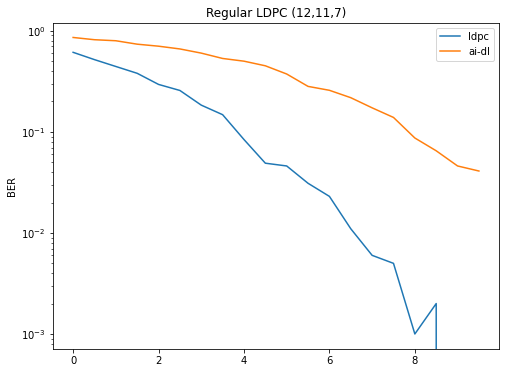

In [20]:
import matplotlib.pyplot as plt
%matplotlib inline
snrs = numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE)
fig, (ax1) = plt.subplots(1,1,figsize=(8,6))
ax1.semilogy(snrs,ber_per_iter_tensor,'', label="ldpc") # plot BER vs SNR
ax1.semilogy(snrs,ber_per_iter_dl_tensor,'', label="ai-dl") # plot BER vs SNR
ax1.set_ylabel('BER')
ax1.set_title('Regular LDPC ({},{},{})'.format(num_of_channel * 2,input_message_length,CHANEL_SIZE-input_message_length))
#ax2.plot(snrs,times_per_iter_pyldpc,'', label="pyldpc") # plot decode timing for different SNRs
#ax2.plot(snrs,times_per_iter_tensor,'', label="tensor") # plot decode timing for different SNRs
#ax2.plot(snrs,times_per_iter_awgn,'', label="commpy-awgn") # plot decode timing for different SNRs
#ax2.set_xlabel('$E_b/$N_0$')
#ax2.set_ylabel('Decoding Time [s]')
#ax2.annotate('Total Runtime: pyldpc:{:03.2f}s awgn:{:03.2f}s tensor:{:03.2f}s'.format(numpy.sum(times_per_iter_pyldpc), 
#            numpy.sum(times_per_iter_awgn), numpy.sum(times_per_iter_tensor)),
#            xy=(1, 0.35), xycoords='axes fraction',
#            xytext=(-20, 20), textcoords='offset pixels',
#            horizontalalignment='right',
#            verticalalignment='bottom')
plt.savefig('ldpc_ber_{}_{}.png'.format(num_of_channel * 2,input_message_length))
plt.legend ()
plt.show()

In [21]:
ch1_x = []
ch1_y = []
ch2_x = []
ch2_y = []
ch3_x = []
ch3_y = []
for c in channel_in:
  ch1_x.append (c[0])
  ch1_y.append (c[1])
  ch2_x.append (c[2])
  ch2_y.append (c[3])
  ch3_x.append (c[4])
  ch3_y.append (c[5])


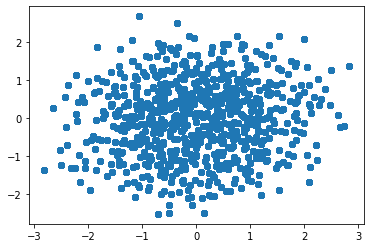

In [22]:
import matplotlib.pyplot as plt


plt.scatter(ch1_x, ch1_y)

plt.show()

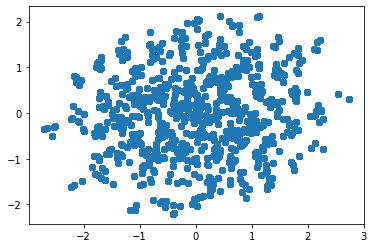

In [23]:
import matplotlib.pyplot as plt


plt.scatter(ch2_x, ch2_y)

plt.show()

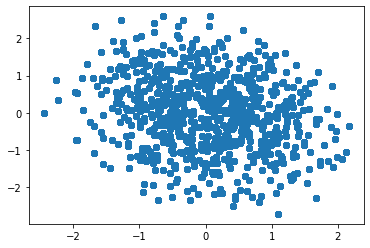

In [24]:

plt.scatter(ch3_x, ch3_y)

plt.show()

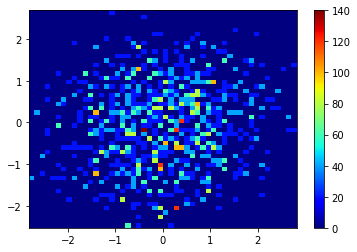

In [25]:
import matplotlib.pyplot as plt

plt.hist2d(ch1_x, ch1_y, (50, 50), cmap=plt.cm.jet)
plt.colorbar()
plt.show()

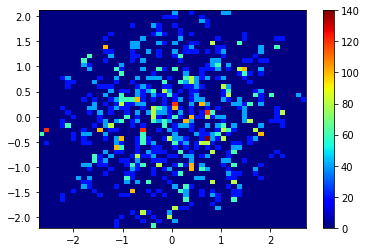

In [26]:
import matplotlib.pyplot as plt

plt.hist2d(ch2_x, ch2_y, (50, 50), cmap=plt.cm.jet)
plt.colorbar()
plt.show()

In [27]:
from sklearn.manifold import TSNE
import pandas as pd
import seaborn

#X = numpy.array([ch1_x, ch2_x, ch3_x, ch1_y, ch2_y, ch3_y]).T
channel_in_embedded = TSNE(n_components=2).fit_transform(channel_in)

tsne_df = pd.DataFrame({'X':channel_in_embedded[:,0],
                        'Y':channel_in_embedded[:,1],
                        'value':data_category})



ModuleNotFoundError: No module named 'sklearn'

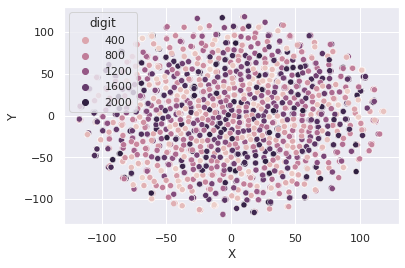

In [252]:
#seaborn.scatterplot(channel_in_embedded[:,0], channel_in_embedded[:,1],hue=data_category, legend='full', palette=['purple','red','orange','brown','blue','dodgerblue','green','lightgreen','darkcyan', 'black'])
#print (data_category)
#palette = seaborn.color_palette("bright", 2**input_message_length)

seaborn.scatterplot(x="X", y="Y", hue="value",  data=tsne_df)


(20000, 2)


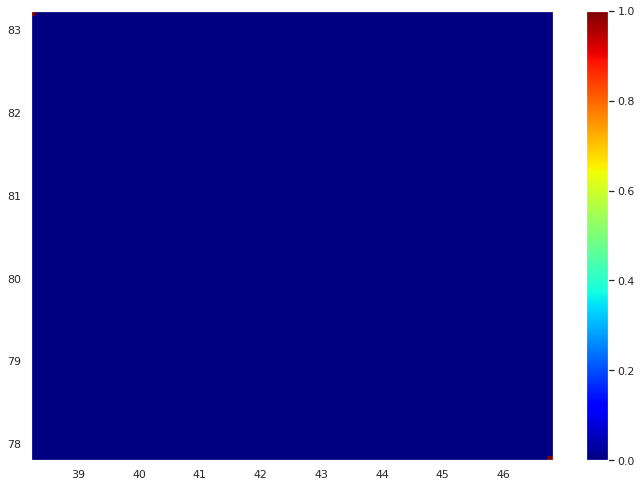

In [232]:
import matplotlib.pyplot as plt
print (channel_in_embedded.shape)
plt.hist2d(channel_in_embedded[0], channel_in_embedded[1], (100, 100), cmap=plt.cm.jet)
plt.colorbar()
plt.show()

In [144]:
testing_input_message = numpy.random.randint(2, size=(NUM_OF_INPUT_MESSAGE,input_message_length))


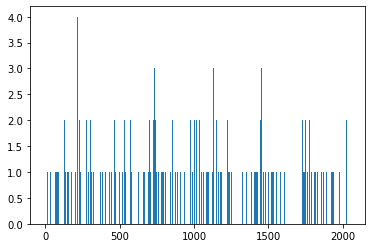

In [131]:
#input_message_length=8
#training_input_message = numpy.random.randint(2, size=(NUM_OF_INPUT_MESSAGE*10,input_message_length))
testing_input_message_decimal = row_bits2int(testing_input_message)
#uniqueValues, indicesList = numpy.unique(training_input_message_decimal, return_index=True)
x_axis = numpy.arange(0,2**input_message_length)
y_axis = row_bits2int(testing_input_message)
#x=numpy.histogram(training_input_message_decimal,bins = x_axis) 
plt.hist(testing_input_message_decimal, bins = x_axis) 
plt.show()

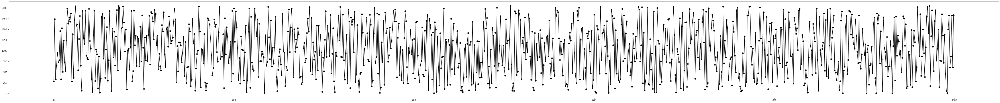

In [132]:
x_axis = numpy.arange(0,NUM_OF_INPUT_MESSAGE*10)
plt.figure(figsize=(80, 8))
plt.plot(x_axis[:NUM_OF_INPUT_MESSAGE],testing_input_message_decimal[:NUM_OF_INPUT_MESSAGE], '-ok')
#print (x_axis[:100])
#print(training_input_message_decimal[:100])

In [145]:
# Here I am using trained model
output_display_counter = NUM_OF_INPUT_MESSAGE/4
ber_per_iter_dl_tensor  = numpy.array(())
times_per_iter_dl_tensor = numpy.array(())

for snr in numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE):
  total_bit_error = 0
  total_msg_error = 0
  total_time = 0
  current_time = time.time()
  sigma = Snr2Sigma (snr)
  for i in range (NUM_OF_INPUT_MESSAGE):
    input_message_xx = testing_input_message [i:i+1]
    input_message_xx_float = input_message_xx.astype("float32")
    encoded_message = train_sess.run ([dl_encoder_output], feed_dict={input_message_x:input_message_xx_float})
    #print (encoded_message[0][0])
    awgn_channel_output_message = sess.run ([awgn_channel_output], feed_dict={awgn_noise_std_dev:sigma, awgn_channel_input:encoded_message[0][0]})
    #print (awgn_channel_output_message)
    decoded_message = train_sess.run ([dl_decoder_only_output], feed_dict={input_channel_x:awgn_channel_output_message})
    #print ("input", input_message[i])
    decoded_message = numpy.around(decoded_message[0][0]).astype(int)
    #print ("output", decoded_message)
    if abs(decoded_message-testing_input_message[i]).sum() != 0 :
      total_msg_error = total_msg_error + 1
    if (i+1) % output_display_counter == 0:
      total_time = timer_update(i, current_time,total_time, output_display_counter)
  ber = float(total_msg_error)/NUM_OF_INPUT_MESSAGE
  print('SNR: {:04.3f}:\n -> BER: {:03.2f}\n -> Total Time: {:03.2f}s'.format(snr,ber,total_time))
  ber_per_iter_dl_tensor=numpy.append(ber_per_iter_dl_tensor ,ber)
  times_per_iter_dl_tensor=numpy.append(times_per_iter_dl_tensor, total_time)

SNR: 0.000 - Iter: 250 - Last 250.0 iterations took 0.27s
SNR: 0.000 - Iter: 500 - Last 250.0 iterations took 0.54s
SNR: 0.000 - Iter: 750 - Last 250.0 iterations took 0.81s
SNR: 0.000 - Iter: 1000 - Last 250.0 iterations took 1.08s
SNR: 0.000:
 -> BER: 0.85
 -> Total Time: 2.69s
SNR: 0.500 - Iter: 250 - Last 250.0 iterations took 0.27s
SNR: 0.500 - Iter: 500 - Last 250.0 iterations took 0.54s
SNR: 0.500 - Iter: 750 - Last 250.0 iterations took 0.80s
SNR: 0.500 - Iter: 1000 - Last 250.0 iterations took 1.07s
SNR: 0.500:
 -> BER: 0.85
 -> Total Time: 2.68s
SNR: 1.000 - Iter: 250 - Last 250.0 iterations took 0.27s
SNR: 1.000 - Iter: 500 - Last 250.0 iterations took 0.53s
SNR: 1.000 - Iter: 750 - Last 250.0 iterations took 0.79s
SNR: 1.000 - Iter: 1000 - Last 250.0 iterations took 1.06s
SNR: 1.000:
 -> BER: 0.79
 -> Total Time: 2.65s
SNR: 1.500 - Iter: 250 - Last 250.0 iterations took 0.26s
SNR: 1.500 - Iter: 500 - Last 250.0 iterations took 0.54s
SNR: 1.500 - Iter: 750 - Last 250.0 itera

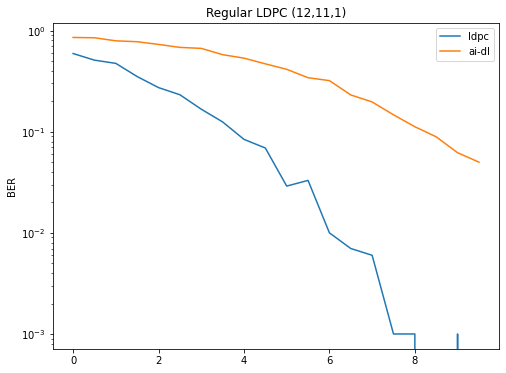

In [146]:
import matplotlib.pyplot as plt
%matplotlib inline
snrs = numpy.arange (SNR_BEGIN, SNR_END, SNR_STEP_SIZE)
fig, (ax1) = plt.subplots(1,1,figsize=(8,6))
ax1.semilogy(snrs,ber_per_iter_tensor,'', label="ldpc") # plot BER vs SNR
ax1.semilogy(snrs,ber_per_iter_dl_tensor,'', label="ai-dl") # plot BER vs SNR
ax1.set_ylabel('BER')
ax1.set_title('Regular LDPC ({},{},{})'.format(num_of_channel * 2,input_message_length,num_of_channel * 2-input_message_length))
#ax2.plot(snrs,times_per_iter_pyldpc,'', label="pyldpc") # plot decode timing for different SNRs
#ax2.plot(snrs,times_per_iter_tensor,'', label="tensor") # plot decode timing for different SNRs
#ax2.plot(snrs,times_per_iter_awgn,'', label="commpy-awgn") # plot decode timing for different SNRs
#ax2.set_xlabel('$E_b/$N_0$')
#ax2.set_ylabel('Decoding Time [s]')
#ax2.annotate('Total Runtime: pyldpc:{:03.2f}s awgn:{:03.2f}s tensor:{:03.2f}s'.format(numpy.sum(times_per_iter_pyldpc), 
#            numpy.sum(times_per_iter_awgn), numpy.sum(times_per_iter_tensor)),
#            xy=(1, 0.35), xycoords='axes fraction',
#            xytext=(-20, 20), textcoords='offset pixels',
#            horizontalalignment='right',
#            verticalalignment='bottom')
plt.savefig('ldpc_ber_{}_{}.png'.format(num_of_channel * 2,input_message_length))
plt.legend ()
plt.show()